In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import datetime
%matplotlib inline
import mplfinance as mpf
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np

In [2]:
df = pd.read_csv('stock_data.csv')
df = df.iloc[::-1]
print(df)
df.info()

              id symbol            timestamp    open    high     low   close  \
2315247  2315750    ZTS  1969-12-31 00:00:00  122.85  122.93  122.84  122.87   
2315246  2315749    ZTS  1970-01-01 00:00:00  122.85  122.93  122.84  122.87   
2315245  2315748    ZTS  2013-02-01 00:00:00   31.50   31.74   30.47   31.01   
2315244  2315747    ZTS  2013-02-04 00:00:00   31.09   31.99   30.76   31.02   
2315243  2315746    ZTS  2013-02-05 00:00:00   31.25   31.98   30.85   31.04   
...          ...    ...                  ...     ...     ...     ...     ...   
4              5      A  2023-07-17 00:00:00  119.95  119.98  117.66  118.25   
3              4      A  2023-07-18 00:00:00  118.38  119.79  118.00  119.56   
2              3      A  2023-07-19 00:00:00  120.01  123.34  119.86  123.08   
1              2      A  2023-07-20 00:00:00  123.51  124.90  123.13  124.55   
0              1      A  2023-07-21 00:00:00  124.55  128.30  123.14  127.56   

           volume  
2315247    597475  

In [3]:
df_copy = df.copy()
df_copy.timestamp = pd.to_datetime(df_copy.timestamp, errors='coerce')
df_copy = df_copy.set_index('timestamp')
df_copy.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2315248 entries, 1969-12-31 to 2023-07-21
Data columns (total 7 columns):
 #   Column  Dtype  
---  ------  -----  
 0   id      int64  
 1   symbol  object 
 2   open    float64
 3   high    float64
 4   low     float64
 5   close   float64
 6   volume  int64  
dtypes: float64(4), int64(2), object(1)
memory usage: 141.3+ MB


               id symbol    open    high     low   close     volume
timestamp                                                          
2003-09-11  19487   AAPL    0.40    0.41    0.39    0.40  213937456
2003-09-12  19486   AAPL    0.40    0.41    0.40    0.41  180005296
2003-09-15  19485   AAPL    0.41    0.41    0.39    0.40  226843296
2003-09-16  19484   AAPL    0.40    0.41    0.40    0.40  269379520
2003-09-17  19483   AAPL    0.40    0.40    0.39    0.39  289396704
...           ...    ...     ...     ...     ...     ...        ...
2023-07-17  14492   AAPL  191.90  194.32  191.81  193.99   50520200
2023-07-18  14491   AAPL  193.35  194.33  192.42  193.73   48353800
2023-07-19  14490   AAPL  193.10  198.23  192.65  195.10   80507300
2023-07-20  14489   AAPL  195.09  196.47  192.50  193.13   59581200
2023-07-21  14488   AAPL  194.10  194.97  191.23  191.94   71917800

[5000 rows x 7 columns]


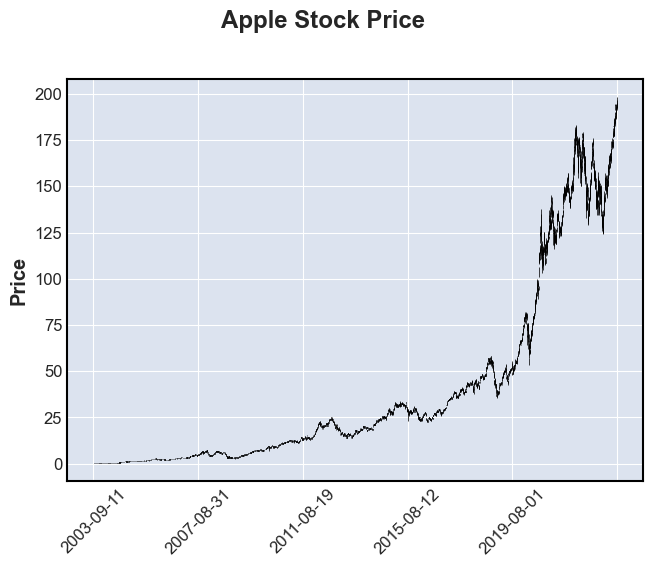

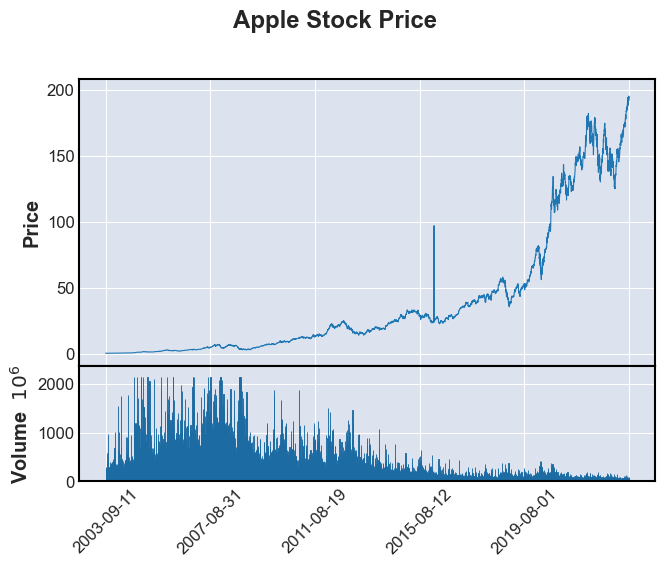

In [4]:
AAPL = df_copy[df_copy.symbol == 'AAPL']
print(AAPL)
mpf.plot(AAPL, title='Apple Stock Price', ylabel='Price', datetime_format='%Y-%m-%d')
mpf.plot(AAPL, type='line', title='Apple Stock Price', ylabel='Price', datetime_format='%Y-%m-%d', volume=True)

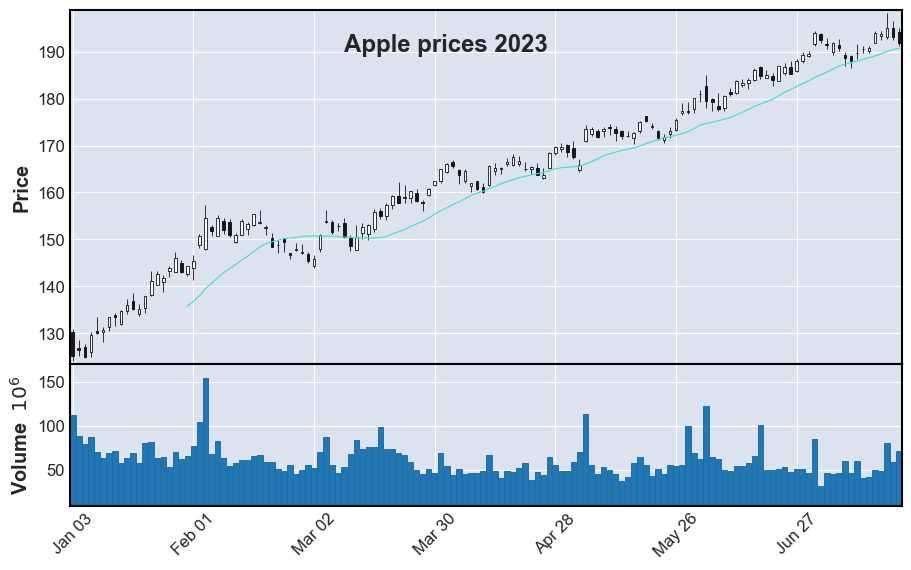

In [5]:
mpf.plot(AAPL['2023-01':'2023-07'], figratio=(20,12),
        type='candle',
        title='Apple prices 2023',
        mav=(20), volume=True,
        tight_layout=True)

In [6]:
AAPL = AAPL.drop(['id','symbol'], axis=1)
INTC = df_copy[df_copy.symbol == 'INTC']
INTC = INTC.drop(['id','symbol'], axis=1)
MSFT = df_copy[df_copy.symbol == 'MSFT']
MSFT = MSFT.drop(['id','symbol'], axis=1)

In [7]:
# Phân tích chỉ số nhóm 
list_stocks = ['AAPL', 'INTC', 'MSFT']
group_stocks = pd.concat([AAPL, INTC, MSFT], axis=1, keys = list_stocks)
group_stocks

AAPL                                       INTC                \
              open    high     low   close     volume    open   high    low   
timestamp                                                                     
2003-09-11    0.40    0.41    0.39    0.40  213937456  27.620  28.35  27.29   
2003-09-12    0.40    0.41    0.40    0.41  180005296  27.810  28.39  27.55   
2003-09-15    0.41    0.41    0.39    0.40  226843296  28.330  28.45  27.91   
2003-09-16    0.40    0.41    0.40    0.40  269379520  28.080  28.99  28.02   
2003-09-17    0.40    0.40    0.39    0.39  289396704  28.940  29.38  28.77   
...            ...     ...     ...     ...        ...     ...    ...    ...   
2023-07-17  191.90  194.32  191.81  193.99   50520200  33.160  34.60  33.07   
2023-07-18  193.35  194.33  192.42  193.73   48353800  34.280  34.70  33.83   
2023-07-19  193.10  198.23  192.65  195.10   80507300  34.400  34.84  34.33   
2023-07-20  195.09  196.47  192.50  193.13   59581200  33.700  34.21  33.23   
2023-07-21  194.10  194.97  191.23  191.94   71917800  33.725  34.25  33.42   

                                MSFT                                    
             close    volume    open    high     low   close    volume  
timestamp                                                               
2003-09-11  28.030  56743684   27.66   28.11   27.59   27.84  37959192  
2003-09-12  28.340  51936196   27.48   28.40   26.70   28.34  55787532  
2003-09-15  27.990  36385680   28.37   28.61   28.33   28.36  41446548  
2003-09-16  28.910  48868584   28.41   28.95   28.32   28.90  52369784  
2003-09-17  28.880  52843560   28.76   28.95   28.47   28.50  47232032  
...            ...       ...     ...     ...     ...     ...       ...  
2023-07-17  34.370  34111200  345.68  346.99  342.20  345.73  20363900  
2023-07-18  34.500  29679500  345.83  366.78  342.17  359.49  64872700  
2023-07-19  34.460  26486700  361.75  362.46  352.44  355.08  39732900  
2023-07-20  33.370  37878000  353.57  357.97  345.37  346.87  33778400  
2023-07-21  34.005  57280138  349.15  350.30  339.83  343.78  69297792  

[5000 rows x 15 columns]

In [8]:
group_stocks.columns.names = ['Stock Symbol', 'Stock Info']
group_stocks

Stock Symbol    AAPL                                       INTC                \
Stock Info      open    high     low   close     volume    open   high    low   
timestamp                                                                       
2003-09-11      0.40    0.41    0.39    0.40  213937456  27.620  28.35  27.29   
2003-09-12      0.40    0.41    0.40    0.41  180005296  27.810  28.39  27.55   
2003-09-15      0.41    0.41    0.39    0.40  226843296  28.330  28.45  27.91   
2003-09-16      0.40    0.41    0.40    0.40  269379520  28.080  28.99  28.02   
2003-09-17      0.40    0.40    0.39    0.39  289396704  28.940  29.38  28.77   
...              ...     ...     ...     ...        ...     ...    ...    ...   
2023-07-17    191.90  194.32  191.81  193.99   50520200  33.160  34.60  33.07   
2023-07-18    193.35  194.33  192.42  193.73   48353800  34.280  34.70  33.83   
2023-07-19    193.10  198.23  192.65  195.10   80507300  34.400  34.84  34.33   
2023-07-20    195.09  196.47  192.50  193.13   59581200  33.700  34.21  33.23   
2023-07-21    194.10  194.97  191.23  191.94   71917800  33.725  34.25  33.42   

Stock Symbol                      MSFT                                    
Stock Info     close    volume    open    high     low   close    volume  
timestamp                                                                 
2003-09-11    28.030  56743684   27.66   28.11   27.59   27.84  37959192  
2003-09-12    28.340  51936196   27.48   28.40   26.70   28.34  55787532  
2003-09-15    27.990  36385680   28.37   28.61   28.33   28.36  41446548  
2003-09-16    28.910  48868584   28.41   28.95   28.32   28.90  52369784  
2003-09-17    28.880  52843560   28.76   28.95   28.47   28.50  47232032  
...              ...       ...     ...     ...     ...     ...       ...  
2023-07-17    34.370  34111200  345.68  346.99  342.20  345.73  20363900  
2023-07-18    34.500  29679500  345.83  366.78  342.17  359.49  64872700  
2023-07-19    34.460  26486700  361.75  362.46  352.44  355.08  39732900  
2023-07-20    33.370  37878000  353.57  357.97  345.37  346.87  33778400  
2023-07-21    34.005  57280138  349.15  350.30  339.83  343.78  69297792  

[5000 rows x 15 columns]

In [9]:
#Max stock historical
group_stocks.xs(key='close',axis=1,level='Stock Info').max()

Stock Symbol
AAPL    195.10
INTC     68.47
MSFT    359.49
dtype: float64

In [10]:
#Tỉ suất lợi nhuận
value_stocks = pd.DataFrame()
for name in list_stocks:
    value_stocks[name + ' value_stocks'] = group_stocks[name]['close'].pct_change()*100
value_stocks

,AAPL value_stocks,INTC value_stocks,MSFT value_stocks
timestamp,,,
2003-09-11,NaN,NaN,NaN
2003-09-12,2.500000,1.105958,1.795977
2003-09-15,-2.439024,-1.235004,0.070572
2003-09-16,0.000000,3.286888,1.904090
2003-09-17,-2.500000,-0.103770,-1.384083
...,...,...,...
2023-07-17,1.730557,3.680241,0.141930
2023-07-18,-0.134028,0.378237,3.979984
2023-07-19,0.707170,-0.115942,-1.226738


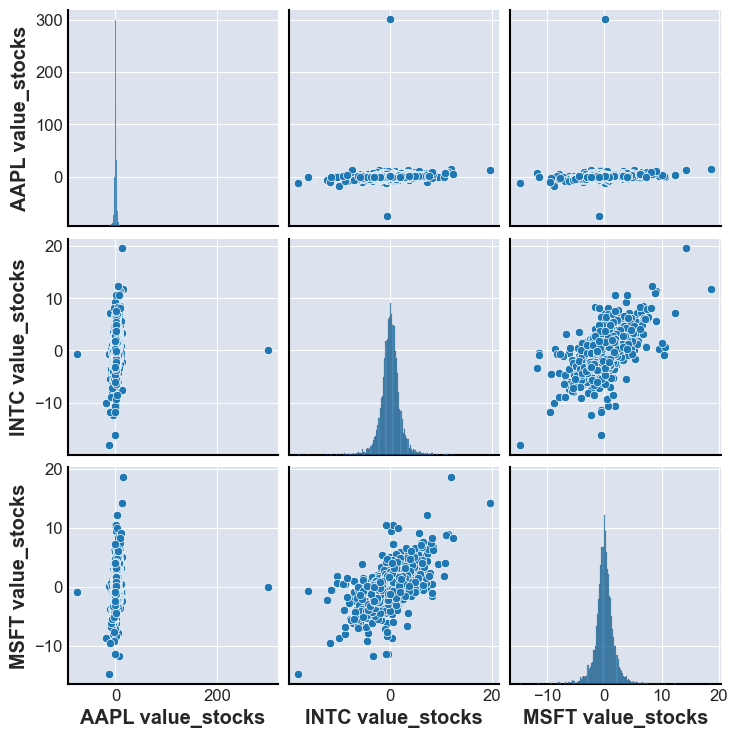

In [11]:
import seaborn as sns
sns.pairplot(value_stocks)

<AxesSubplot: xlabel='AAPL value_stocks', ylabel='Density'>

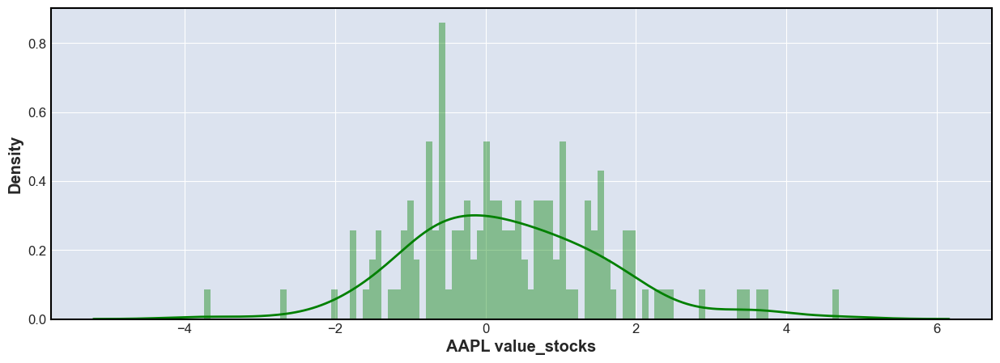

In [12]:
plt.figure(figsize=(15,5))
sns.distplot(value_stocks.loc['2023-01-01':'2023-07-21']['AAPL value_stocks'], color='green', bins=100)

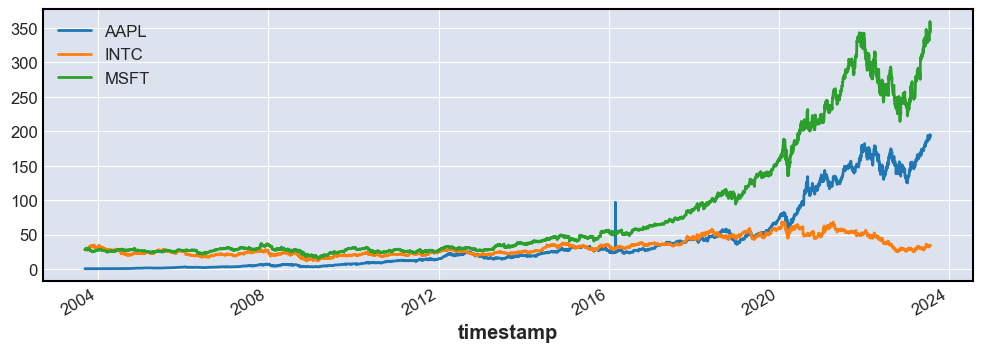

In [13]:
for ticker in list_stocks:
    group_stocks[ticker]['close'].plot(figsize=(12,4), label=ticker)
plt.legend()

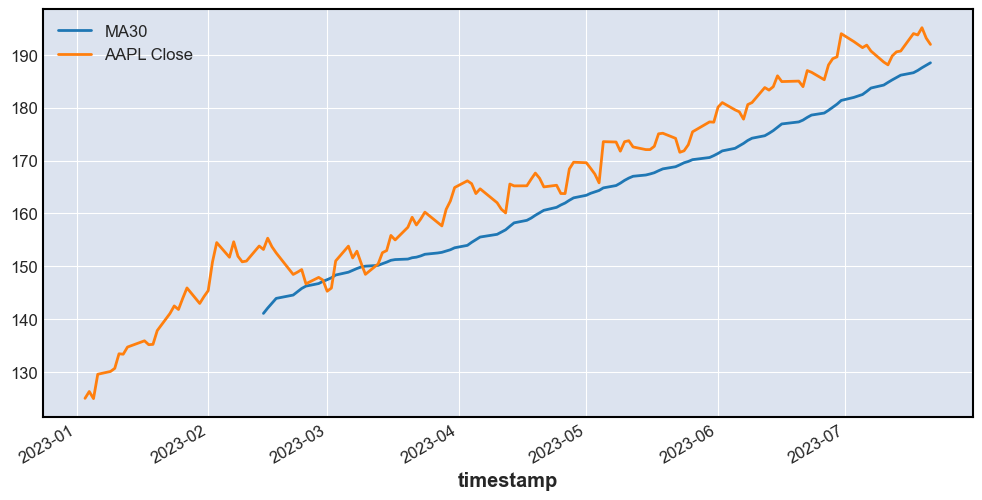

In [14]:
# Vẽ đường trung bình động ( biến động, xu hướng )
plt.figure(figsize=(12,6))
AAPL['close'].loc['2023-01-01':'2023-07-21'].rolling(window=30).mean().plot(label='MA30')
AAPL['close'].loc['2023-01-01':'2023-07-21'].plot(label='AAPL Close')
plt.legend()

<AxesSubplot: xlabel='Stock Symbol', ylabel='Stock Symbol'>

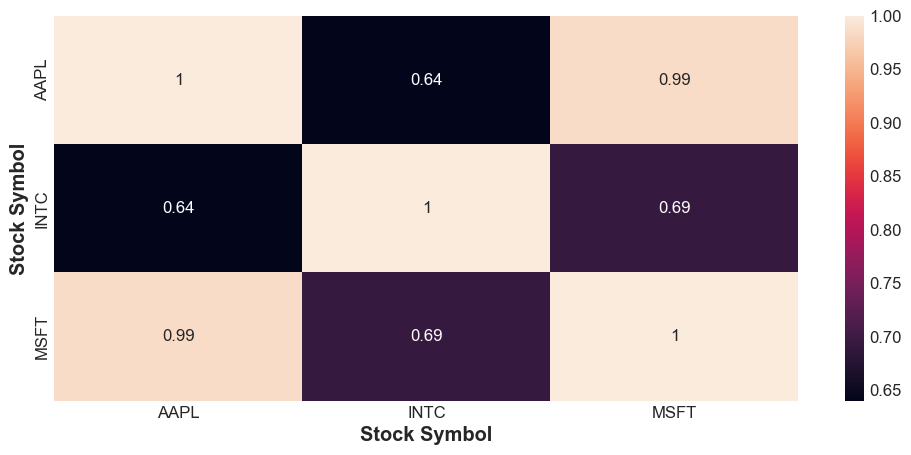

In [15]:
# Biểu đồ nhiệt ( heat map )
plt.figure(figsize=(12,5))
sns.heatmap(group_stocks.xs(key='close',axis=1, level='Stock Info').corr(),annot=True)

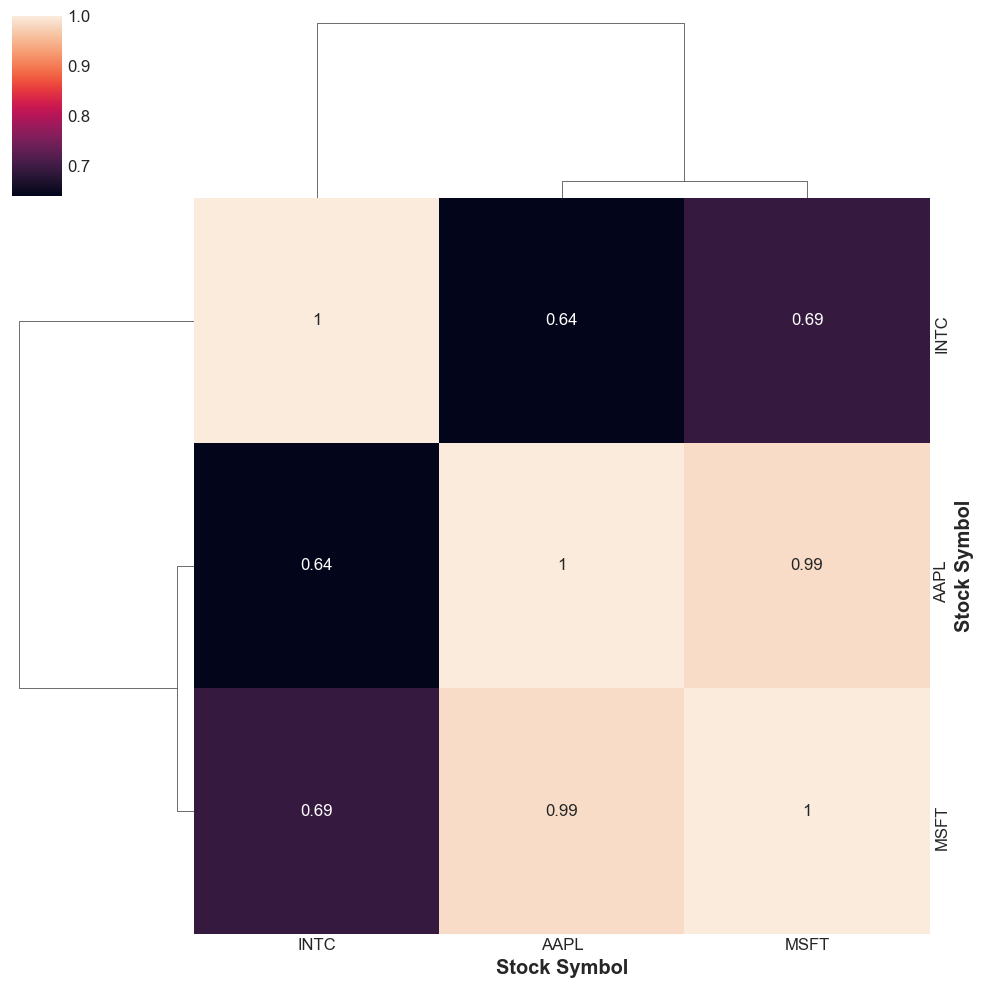

In [16]:
sns.clustermap(group_stocks.xs(key='close',axis=1,level='Stock Info').corr(),annot=True)

In [17]:
import cufflinks as cf
cf.go_offline()
import plotly.io as pio

In [18]:
group_stocks.xs(key='close',axis=1,level='Stock Info').iplot(title= 'Giá đóng cửa', xTitle = 'Năm', yTitle = 'Giá')

In [19]:
# Vẽ SMA đường trung bình động
AAPL['close'].loc['2023-01-01':'2023-07-21'].ta_plot(study='sma',periods=[7,14,21],title='SMA AAPL')

In [20]:
# Vẽ dải bollinger
AAPL['close'].loc['2023-01-01':'2023-07-21'].ta_plot(study='boll')

In [21]:
# Candle chart
AAPL[['open','high','low','close']].loc['2023-01-01':'2023-07-21'].iplot(kind='candle')

In [22]:
cf.datagen.ohlc()
aapl_plot = cf.QuantFig(AAPL, title = 'Biểu đồ nến', legend= 'Top', name = 'Nến')
aapl_plot.add_bollinger_bands(colors = ['red', 'green'])
aapl_plot.iplot()

In [23]:
aapl_plot.add_sma([10,20],width=2,color=['green','lightgreen'],legendgroup=True)
aapl_plot.add_rsi(periods=20,color='java')
aapl_plot.add_bollinger_bands(periods=20, boll_std=2, colors=['magenta', 'grey'], fill = True)
aapl_plot.add_volume()
aapl_plot.add_macd()
aapl_plot.iplot()

In [24]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize']=20,10
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import LSTM,Dropout,Dense
from sklearn.preprocessing import MinMaxScaler

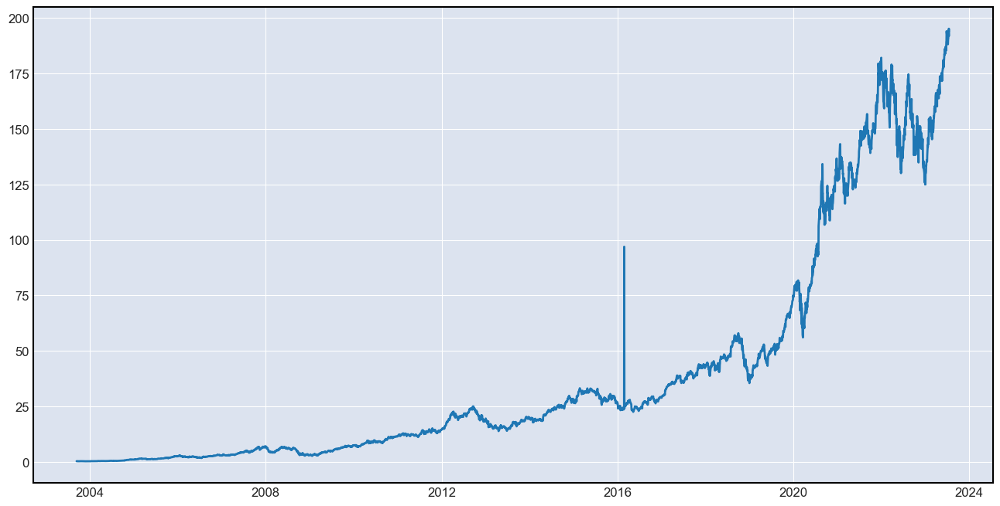

In [25]:
plt.figure(figsize=(16,8))
plt.plot(AAPL["close"],label='Close Price history of Apple')

In [26]:
data = df.copy()
data = data[data.symbol == 'AAPL']
dataset = data.filter({'close'})
dataset = dataset.values
# Preprocessing
data['timestamp'] = pd.to_datetime(data['timestamp'])
data.set_index('timestamp', inplace=True)

# Select training data (2003 to 2022) and testing data (2023)
train_data = data.loc[:'2022-12-31']
test_data = data.loc['2023-01-01':]

In [27]:
scaler = MinMaxScaler()
scaled_data  = scaler.fit_transform(dataset)
scaled_data

array([[2.56739409e-04],
       [3.08087291e-04],
       [2.56739409e-04],
       ...,
       [1.00000000e+00],
       [9.89884467e-01],
       [9.83774069e-01]])

In [28]:
train_data = scaled_data[0:len(train_data), :]
train_data

array([[2.56739409e-04],
       [3.08087291e-04],
       [2.56739409e-04],
       ...,
       [6.45391528e-01],
       [6.63722721e-01],
       [6.65365854e-01]])

In [29]:
# Prepare data for LSTM
look_back = 60  # Define your sequence length
x_train, y_train = [], []
for i in range(look_back, len(train_data)):
    x_train.append(train_data[i-look_back:i,0])
    y_train.append(train_data[i, 0])  # 'close' column for target
x_train, y_train = np.array(x_train), np.array(y_train)

In [30]:
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
x_train.shape

(4802, 60, 1)

In [31]:
# build the LSTM model
model = Sequential()
model.add(LSTM(50, return_sequences=True, input_shape=(x_train.shape[1],1)))
model.add(LSTM(50, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

In [32]:
# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

In [33]:
# train the model
model.fit(x_train, y_train, batch_size=1, epochs=1)

4802/4802 [==============================] - 70s 14ms/step - loss: 8.7364e-04


In [34]:
test_data = scaled_data[len(train_data) - look_back:, :]
x_test = []
y_test = dataset[len(train_data):, :]
for i in range(60, len(test_data)):
  x_test.append(test_data[i-look_back:i,0])
x_test = np.array(x_test)

In [35]:
# reshape the data
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1],1))

In [36]:
# Predict for 2023
predicted_closing_price = model.predict(x_test)                                

5/5 [==============================] - 1s 8ms/step


In [37]:
predicted_closing_price = scaler.inverse_transform(predicted_closing_price)
predicted_closing_price

array([[134.89394],
       [133.92891],
       [133.11269],
       [132.27383],
       [132.16107],
       [132.4141 ],
       [132.86684],
       [133.70903],
       [134.57108],
       [135.50327],
       [136.48232],
       [137.23677],
       [137.80087],
       [138.55089],
       [139.6934 ],
       [141.01701],
       [142.13824],
       [143.30687],
       [144.58261],
       [145.31964],
       [145.92284],
       [146.52681],
       [147.76651],
       [149.56268],
       [150.95126],
       [152.394  ],
       [153.26488],
       [153.65607],
       [153.81529],
       [154.2345 ],
       [154.5983 ],
       [155.1873 ],
       [155.55885],
       [155.6515 ],
       [155.08057],
       [154.402  ],
       [153.83252],
       [153.02866],
       [152.42685],
       [151.91762],
       [151.24657],
       [150.69989],
       [150.9626 ],
       [151.86913],
       [152.60718],
       [153.36227],
       [153.69727],
       [153.54308],
       [153.4781 ],
       [153.72226],


In [38]:
# get the rmse (root mean squared error)
rmse = np.sqrt(np.mean(predicted_closing_price - y_test)**2)
rmse

0.31466377590013683

In [41]:
import plotly.graph_objects as go
import plotly.io as pio

train = data[:len(train_data)]
valid = data[len(train_data):]
valid['Prediction'] = predicted_closing_price

# Create a figure
fig = go.Figure()

# Add the training data
fig.add_trace(go.Scatter(x=train.index, y=train['close'], mode='lines', name='Train'))

# Add the validation true data
fig.add_trace(go.Scatter(x=valid.index, y=valid['close'], mode='lines', name='Val'))

# Add the predicted data
fig.add_trace(go.Scatter(x=valid.index, y=valid['Prediction'], mode='lines', name='Predictions'))

# Update layout
fig.update_layout(
    title='Model',
    xaxis_title='Date',
    yaxis_title='Close price USD ($)',
    legend=dict(title='Variable')
)

# Show the plot
pio.show(fig)
